# Yeni başlayanlar için Çekiştirmeli Üretici Ağlar (ÇÜAlar) veya Generative Adversarial Networks (GANs) 
## Cifar 10 kullanarak renkli küçük resimler oluşturmak için GAN
###  [Meltem Atay](https://github.com/neuroscitechie) tarafından Deep Learning Türkiye  Ankara Toplantısı için Türkçeleştirildi.

<img src="notebook-images/dltr.png" />
Kaynak kitap: [the O'Reilly interactive tutorial on generative adversarial networks](https://www.oreilly.com/learning/generative-adversarial-networks-for-beginners). 

### Kullanılan kütüphaneler:

 [TensorFlow](https://www.tensorflow.org/install/), 
 [NumPy](https://docs.scipy.org/doc/numpy/user/install.html), 
 [matplotlib](https://matplotlib.org/) 
 [Jupyter](https://jupyter.readthedocs.io/en/latest/install.html)

## Giriş

Yann Lecun'a göre çekişmeli öğrenme derin öğrenmenin en iyi fikirlerindendir. 
<img src="notebook-images/lecun.jpeg" />
GAN'lar ilk olarak [Ian Goodfellow et al. in 2014](https://arxiv.org/abs/1406.2661) tarafından tarif edildiğinden beri büyük ilgi oldağı olmuştur.
GAN'lar girdi olarak verilen verisetinden sentetik veri seti oluşturmaya yönelik çalışan yapay sinir ağlarıdır.
Örnek GAN çalışmaları:
<img src="notebook-images/lsun_bedrooms_real.png" />

<img src="notebook-images/lsun_bedrooms_five_epoch_samples.png" />

<img src="notebook-images/albums_128px.png" />

<img src="notebook-images/faces_arithmetic_collage_v2.png" />

<img src="notebook-images/faces_128_filter_samples.png" />

<img src="notebook-images/faces_arithmetic_collage_v2.png" />


Bu çalışmalar oldukça karmaşık olsa da, aslında GAN oluşturmak o kadar da zor değildir...
Örneğin MNIST üzerinden vanilla-GAN kullanılarak oluşan sentetik rakamlar aşağıdadır.


<img src="notebook-images/gan-animation.gif" />
Çalışma boyunca en stabil GAN mimarilerinden olan WGAN kullanarak CIFAR10 veri setinde yeni objeler oluşturacağız. 

## GAN Mimarisi
### Örnek olarak DCGAN (derin evrişimsel üretici ağ yapısı)

GAN yapısı iki modelin bir araya gelmesinden oluşur: 
Üretici model ve Ayırt edici model:
![caption](notebook-images/GAN_Overall.png)
Ayırt edici model elindeki resmin gerçek verisetindeki resimlere veya uydurma bir olabileceğini sınıflayan basit bir ikili sınıflandırma yapısıdır. Bilinen bir evrişimsel sinir ağı yapısında olabilir.

Üretici Model ise veri seti içinden rastgele girdi değerlerini alıp bunları yeni resimlere dönüştürür. Üretici ağ genelde evrişim işleminin tersini alarak çalışmaktadır ancak güncel mimarilerde bu da değişmektedir.

Üretici ve Ayırt Edici ağlarının ağırlık ve biasları backpropagation (geri besleme) algoritması ile birlikte hesaplanır.
Ayırt edici ağ, üretilen resimleri gerçek veya uydurma olarak ayırmaya çalışırken, üretici ağ ise ayırt edici ağı kandıracak resimleri ayırt edici ağı daha iyi kandıracak şekilde üretmeye çalışır.
![caption](notebook-images/ganm.png)
![caption](notebook-images/GAN Algorithm.png)

![caption](notebook-images/ganthing.png)
- Mavi çizgi Ayırt edici Ağ için loss fonksiyonu grafiği
- Siyah Nokta veri seti miktarı
- Yeşil çizgi üretilen veri seti miktarı


a) training başı
b) yeni resimler üretilmeye başladıkça
c) daha çok resim üretildiğindeki durum
d) girdi veriseti ile üretilen veriseti aynı boyutlara ulaştığındaki son durum ~ Nash-Equilibrium...

## Hadi başlayalım...

Bu uygulamada [Keras](https://keras.io/)  ve  [TensorFlow](https://www.tensorflow.org/), kullanağız.


## Veri seti:
### cifar 10 
<img src="notebook-images/cifar10.png" />


Kod  https://github.com/martinarjovsky/WassersteinGAN kaynağından uyarlanmıştır.

In [1]:
## Keras arkasında tensorflow backend kullanıyoruz
import os
os.environ['KERAS_BACKEND']='tensorflow' 
os.environ['THEANO_FLAGS']='floatX=float32,device=cuda,optimizer=fast_compile'

In [2]:
import keras.backend as K
K.set_image_data_format('channels_first')
from keras.models import Sequential, Model
from keras.layers import Conv2D, ZeroPadding2D, BatchNormalization, Input
from keras.layers import Conv2DTranspose, Reshape, Activation, Cropping2D, Flatten
from keras.layers.advanced_activations import LeakyReLU
from keras.activations import relu
from keras.initializers import RandomNormal
conv_init = RandomNormal(0, 0.02)
gamma_init = RandomNormal(1., 0.02)


Using TensorFlow backend.


## Ayırt edici ağ

WassersteinGAN-DCGAN'ın üzerinde farklı bir kayıp (loss) fonksiyonu kullanarak çalıştığı için ayırt edici ağ bir evrişimsel sinir ağıdır, cifar 10'un resim boyutu 32x32 olduğu için girdi olarak 32x32x3 kanallı resim girdisini alır, ve bunu veri seti içinde bulunan  "gerçek" veya üretici ağ tarafından oluşturulmuş "uydurma" olarak ikili sınıflamalardan birini temsil eden bir skalar değere dönüştürür.

![caption](notebook-images/GAN_D.png)
Ayırt edici ağ yapısı [TensorFlow'un CNN modeli](https://www.tensorflow.org/get_started/mnist/pros) gibi olsa da 3 evrişimsel sinir ağı ve 4x4 filtreden oluşmaktadır.

In [3]:
def DCGAN_D(isize, nz, nc, ndf, n_extra_layers=0):
    assert isize%2==0
    _ = inputs = Input(shape=(nc, isize, isize))
    _ = Conv2D(filters=ndf, kernel_size=4, strides=2, use_bias=False,
                        padding = "same",
                        kernel_initializer = conv_init, 
                        name = 'initial.conv.{0}-{1}'.format(nc, ndf)             
                        ) (_)
    _ = LeakyReLU(alpha=0.2, name = 'initial.relu.{0}'.format(ndf))(_)
    csize, cndf = isize// 2, ndf
    while csize > 5:
        assert csize%2==0
        in_feat = cndf
        out_feat = cndf*2
        _ = Conv2D(filters=out_feat, kernel_size=4, strides=2, use_bias=False,
                        padding = "same",
                        kernel_initializer = conv_init,
                        name = 'pyramid.{0}-{1}.conv'.format(in_feat, out_feat)             
                        ) (_)
        if 0: # toggle batchnormalization
            _ = BatchNormalization(name = 'pyramid.{0}.batchnorm'.format(out_feat),                                   
                                   momentum=0.9, axis=1, epsilon=1.01e-5,
                                   gamma_initializer = gamma_init, 
                                  )(_, training=1)        
        _ = LeakyReLU(alpha=0.2, name = 'pyramid.{0}.relu'.format(out_feat))(_)
        csize, cndf = (csize+1)//2, cndf*2
    _ = Conv2D(filters=1, kernel_size=csize, strides=1, use_bias=False,
                        kernel_initializer = conv_init,
                        name = 'final.{0}-{1}.conv'.format(cndf, 1)         
                        ) (_)
    outputs = Flatten()(_)
    return Model(inputs=inputs, outputs=outputs)


## Üretici Ağ
Ayırt edici ağımızı tanımladığımıza göre üretici ağımızı tanımlayalım:

![caption](notebook-images/GAN_g.png)

Kernel boyutu 4x4 olan ve 3D evrişim modelinin transpose halini içeren üç adet ters evrişim işleminden oluşur. 
Sonuçta 32x32x3 resimler oluşturur.
Burada hiperbolik tanjant aktivasyon fonksiyonu kullanılmıştır. https://keras.io/activations/

<img src="notebook-images/TanhReal.gif" />


In [4]:
def DCGAN_G(isize, nz, nc, ngf, n_extra_layers=0):
    cngf= ngf//2
    tisize = isize
    while tisize > 5:
        cngf = cngf * 2
        assert tisize%2==0
        tisize = tisize // 2
    _ = inputs = Input(shape=(nz,))
    _ = Reshape((nz, 1,1))(_)
    _ = Conv2DTranspose(filters=cngf, kernel_size=tisize, strides=1, use_bias=False,
                           kernel_initializer = conv_init, 
                           name = 'initial.{0}-{1}.convt'.format(nz, cngf))(_)
    _ = BatchNormalization(gamma_initializer = gamma_init, momentum=0.9, axis=1, epsilon=1.01e-5,
                               name = 'initial.{0}.batchnorm'.format(cngf))(_, training=1)
    _ = Activation("relu", name = 'initial.{0}.relu'.format(cngf))(_)
    csize, cndf = tisize, cngf
    

    while csize < isize//2:
        in_feat = cngf
        out_feat = cngf//2
        _ = Conv2DTranspose(filters=out_feat, kernel_size=4, strides=2, use_bias=False,
                        kernel_initializer = conv_init, padding="same",
                        name = 'pyramid.{0}-{1}.convt'.format(in_feat, out_feat)             
                        ) (_)
        _ = BatchNormalization(gamma_initializer = gamma_init, 
                                   momentum=0.9, axis=1, epsilon=1.01e-5,
                                   name = 'pyramid.{0}.batchnorm'.format(out_feat))(_, training=1)
        
        _ = Activation("relu", name = 'pyramid.{0}.relu'.format(out_feat))(_)
        csize, cngf = csize*2, cngf//2
    _ = Conv2DTranspose(filters=nc, kernel_size=4, strides=2, use_bias=False,
                        kernel_initializer = conv_init, padding="same",
                        name = 'final.{0}-{1}.convt'.format(cngf, nc)
                        )(_)
    outputs = Activation("tanh", name = 'final.{0}.tanh'.format(nc))(_)
    return Model(inputs=inputs, outputs=outputs)


Parametrelerimizi tanımlayalım.

In [5]:
nc = 3 # number of channels
nz = 100
ngf = 64 # number of discriminator  features 
ndf = 64 # number of generator features
n_extra_layers = 0
Diters = 5 # iteration dimension
λ = 10 # wasserstein loss katsayısı

imageSize = 32
batchSize = 64
lrD = 1e-4 # ayırt edici ağ öğrenme katsayısı
lrG = 1e-4 # üretici ağ ağ öğrenme katsayısı


Ayırt edici ağ yapımız ve parametre sayıları:

In [6]:
netD = DCGAN_D(imageSize, nz, nc, ndf, n_extra_layers)
netD.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 3, 32, 32)         0         
_________________________________________________________________
initial.conv.3-64 (Conv2D)   (None, 64, 16, 16)        3072      
_________________________________________________________________
initial.relu.64 (LeakyReLU)  (None, 64, 16, 16)        0         
_________________________________________________________________
pyramid.64-128.conv (Conv2D) (None, 128, 8, 8)         131072    
_________________________________________________________________
pyramid.128.relu (LeakyReLU) (None, 128, 8, 8)         0         
_________________________________________________________________
pyramid.128-256.conv (Conv2D (None, 256, 4, 4)         524288    
_________________________________________________________________
pyramid.256.relu (LeakyReLU) (None, 256, 4, 4)         0         
__________

Üretici ağ yapımız ve parametre sayıları:

In [7]:
netG = DCGAN_G(imageSize, nz, nc, ngf, n_extra_layers)
netG.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 100)               0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 100, 1, 1)         0         
_________________________________________________________________
initial.100-256.convt (Conv2 (None, 256, 4, 4)         409600    
_________________________________________________________________
initial.256.batchnorm (Batch (None, 256, 4, 4)         1024      
_________________________________________________________________
initial.256.relu (Activation (None, 256, 4, 4)         0         
_________________________________________________________________
pyramid.256-128.convt (Conv2 (None, 128, 8, 8)         524288    
_________________________________________________________________
pyramid.128.batchnorm (Batch (None, 128, 8, 8)         512       
__________

Keras'tan optimize edici fonksiyonlarımızı çekelim:

In [8]:
from keras.optimizers import RMSprop, SGD, Adam

Wasserstein Uzaklık fonksiyonumuzu tanımlayalım:
Bu uzaklık, normal olmayan sınırların ölçümünü kolaylaştırır...
p'nin 1'den büyük ve Pp(M) nin  M içindeki x0 için p. momentindeki µ'nün M'deki olasılık ölçütü olduğunu var sayarsak...
<img src="notebook-images/mm.png" />
µ ve υ arasındaki p. boyuttaki olasılık ölçütü:  <img src="notebook-images/pp.png" />

<img src="notebook-images/ww.png" />

<img src="notebook-images/w-distance.png" />

In [9]:
netD_real_input = Input(shape=(nc, imageSize, imageSize))
noisev = Input(shape=(nz,))
netD_fake_input = netG(noisev)

ϵ_input = K.placeholder(shape=(None,1,1,1))
netD_mixed_input = Input(shape=(nc, imageSize, imageSize),
    tensor=ϵ_input * netD_real_input + (1-ϵ_input) * netD_fake_input)


loss_real = K.mean(netD(netD_real_input))
loss_fake = K.mean(netD(netD_fake_input))

grad_mixed = K.gradients(netD(netD_mixed_input), [netD_mixed_input])[0]
norm_grad_mixed = K.sqrt(K.sum(K.square(grad_mixed), axis=[1,2,3]))
grad_penalty = K.mean(K.square(norm_grad_mixed -1))

loss = loss_fake - loss_real + λ * grad_penalty


training_updates = Adam(lr=lrD, beta_1=0.0, beta_2=0.9).get_updates(netD.trainable_weights,[],loss)
netD_train = K.function([netD_real_input, noisev, ϵ_input],
                        [loss_real, loss_fake],    
                        training_updates)

In [10]:
loss = -loss_fake 
training_updates = Adam(lr=lrG, beta_1=0.0, beta_2=0.9).get_updates(netG.trainable_weights,[], loss)
netG_train = K.function([noisev], [loss], training_updates)


## cifar 10 indirme ve hazırlık

In [11]:
from PIL import Image
import numpy as np
import tarfile

# Download dataset
url = "https://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz"
import os
import urllib
from urllib.request import urlretrieve
def reporthook(a,b,c):
    print("\rdownloading: %5.1f%%"%(a*b*100.0/c), end="")
tar_gz = "cifar-10-python.tar.gz"
if not os.path.isfile(tar_gz):
        print('Downloading data from %s' % url)
        urlretrieve(url, tar_gz, reporthook=reporthook)

import pickle
train_X=[]
train_y=[]
tar_gz = "cifar-10-python.tar.gz"
with tarfile.open(tar_gz) as tarf:
    for i in range(1, 6):
        dataset = "cifar-10-batches-py/data_batch_%d"%i
        print("load",dataset)
        with tarf.extractfile(dataset) as f:
            result = pickle.load(f, encoding='latin1')
        train_X.extend( result['data'].reshape(-1,3,32,32)/255*2-1)
        train_y.extend(result['labels'])
    train_X=np.float32(train_X)
    train_y=np.int32(train_y)
    dataset = "cifar-10-batches-py/test_batch"
    print("load",dataset)
    with tarf.extractfile(dataset) as f:
        result = pickle.load(f, encoding='latin1')
        test_X=np.float32(result['data'].reshape(-1,3,32,32)/255*2-1)
        test_y=np.int32(result['labels'])
        

load cifar-10-batches-py/data_batch_1
load cifar-10-batches-py/data_batch_2
load cifar-10-batches-py/data_batch_3
load cifar-10-batches-py/data_batch_4
load cifar-10-batches-py/data_batch_5
load cifar-10-batches-py/test_batch


In [12]:
train_X = np.concatenate([train_X, test_X])
train_X = np.concatenate([train_X[:,:,:,::-1], train_X])

### Cifar 10 sınıflarını görselleştirme

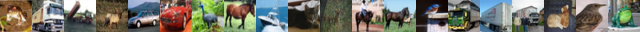

[6 9 9 4 1 1 2 7 8 3 4 7 7 2 9 9 9 3 2 6]
['frog' 'truck' 'truck' 'deer' 'car' 'car' 'bird' 'horse' 'boat' 'cat'
 'deer' 'horse' 'horse' 'bird' 'truck' 'truck' 'truck' 'cat' 'bird' 'frog']


In [13]:
from IPython.display import display
def showX(X, rows=1):
    assert X.shape[0]%rows == 0
    int_X = ( (X+1)/2*255).clip(0,255).astype('uint8')
    # N*3072 -> N*3*32*32 -> 32 * 32N * 3
    int_X = np.moveaxis(int_X.reshape(-1,3,32,32), 1, 3)
    int_X = int_X.reshape(rows, -1, 32, 32,3).swapaxes(1,2).reshape(rows*32,-1, 3)
    display(Image.fromarray(int_X))
showX(train_X[:20])
print(train_y[:20])
name_array = np.array("airplane car bird cat deer dog frog horse boat truck".split(' '))
print(name_array[train_y[:20]])

Gürültü ekliyoruz...

In [14]:
fixed_noise = np.random.normal(size=(batchSize, nz)).astype('float32')

## Yeni resimler üretelim!

GAN yapısında dikkat etmemiz gereken nokta; kayıp (loss) fonksiyonlarımız. Elimizde iki adet loss fonksiyonu var, bir tanesi üretici ağın daha iyi resim oluşturmasını sağlıyor diğeri de aynı zamanda ayırt edici ağın üretilen resimlerle verisetinde bulunan resimleri ayırt etmesini sağlıyor.

Üretici ve ayırt edici ağlar birlikte çalıştırıldığından, ayırt edici ağ gerçek ve uydurma resimleri ayırt etmede daha iyi hale geliyor, bu sırada üretici ağ ise ağırlık ve bias değerlerini ikna edici resimler oluşturmak üzere ayarlıyor:

### İşte sonuçlar:

[0/100][100/1875][0] Loss_D: 51.372623 Loss_G: 0.000000 Loss_D_real: 48.297508 Loss_D_fake -3.075116 2.879977226257324


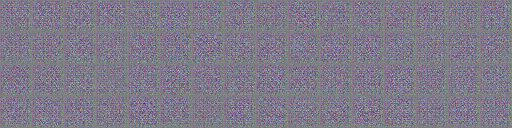

[2/100][1200/1875][500] Loss_D: 5.504436 Loss_G: 3.722685 Loss_D_real: 7.301629 Loss_D_fake 1.797193 73.01580095291138


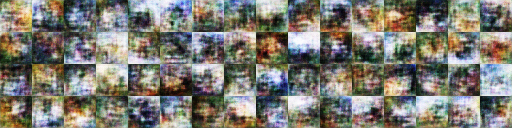

[3/100][1875/1875][1000] Loss_D: 5.196552 Loss_G: -2.662565 Loss_D_real: 4.572980 Loss_D_fake -0.623571 112.10265254974365


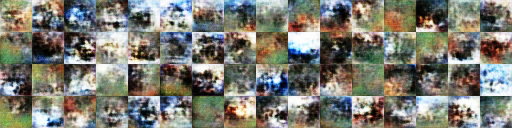

[5/100][720/1875][1500] Loss_D: 3.810576 Loss_G: 0.080929 Loss_D_real: 0.240696 Loss_D_fake -3.569880 152.45485043525696


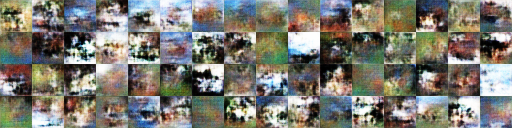

[6/100][1440/1875][2000] Loss_D: 2.555419 Loss_G: -1.420676 Loss_D_real: -3.067561 Loss_D_fake -5.622980 192.5561864376068


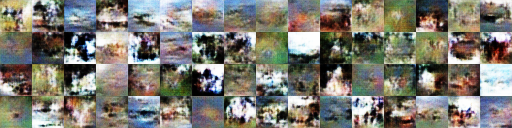

[8/100][285/1875][2500] Loss_D: 3.136904 Loss_G: 0.174634 Loss_D_real: 1.748881 Loss_D_fake -1.388023 232.5674204826355


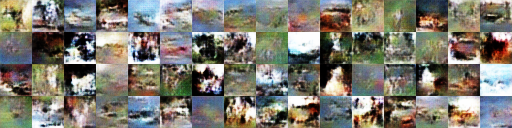

[9/100][1005/1875][3000] Loss_D: 3.364236 Loss_G: -0.387517 Loss_D_real: -1.508052 Loss_D_fake -4.872289 272.2017605304718


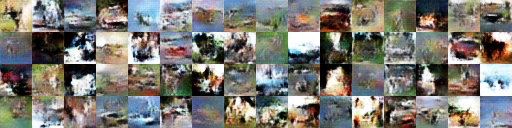

[10/100][1725/1875][3500] Loss_D: 3.172344 Loss_G: 1.239309 Loss_D_real: 6.199172 Loss_D_fake 3.026828 312.1971974372864


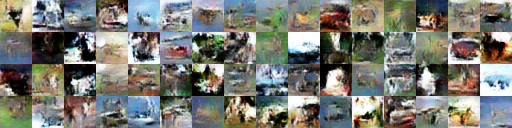

[12/100][570/1875][4000] Loss_D: 3.193921 Loss_G: 0.268051 Loss_D_real: 3.408950 Loss_D_fake 0.215030 352.3725883960724


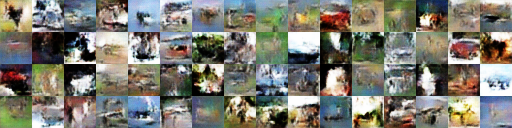

[13/100][1290/1875][4500] Loss_D: 3.179168 Loss_G: 1.215423 Loss_D_real: -0.636992 Loss_D_fake -3.816160 391.8373329639435


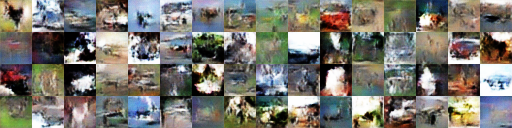

[15/100][135/1875][5000] Loss_D: 2.805799 Loss_G: 1.960539 Loss_D_real: 0.135943 Loss_D_fake -2.669856 432.0237658023834


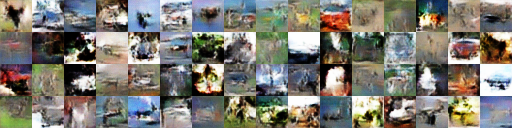

[16/100][855/1875][5500] Loss_D: 4.017488 Loss_G: -0.882780 Loss_D_real: 1.665856 Loss_D_fake -2.351632 471.4860243797302


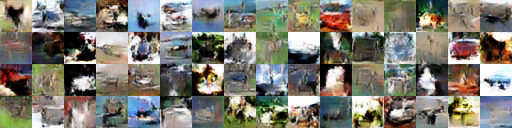

[17/100][1575/1875][6000] Loss_D: 2.089796 Loss_G: 0.958926 Loss_D_real: 2.592123 Loss_D_fake 0.502327 511.1612071990967


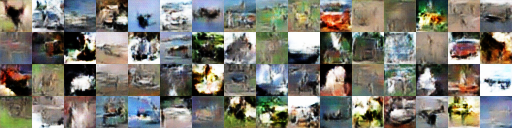

[19/100][420/1875][6500] Loss_D: 2.903962 Loss_G: 1.081799 Loss_D_real: 2.227464 Loss_D_fake -0.676498 551.4014160633087


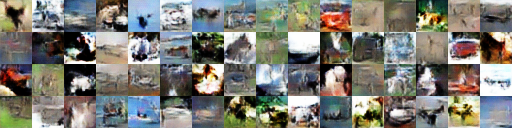

[20/100][1140/1875][7000] Loss_D: 3.778580 Loss_G: 3.104825 Loss_D_real: 5.318027 Loss_D_fake 1.539447 590.7423121929169


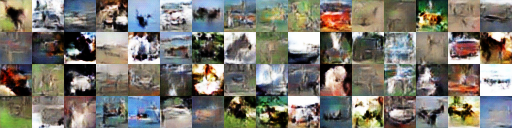

[21/100][1860/1875][7500] Loss_D: 2.161247 Loss_G: 1.713586 Loss_D_real: -1.117706 Loss_D_fake -3.278953 630.7795763015747


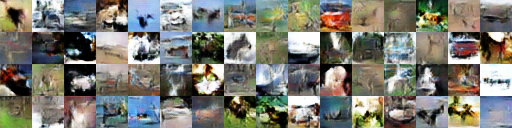

[23/100][705/1875][8000] Loss_D: 1.996251 Loss_G: 0.008848 Loss_D_real: -1.532523 Loss_D_fake -3.528774 670.7000484466553


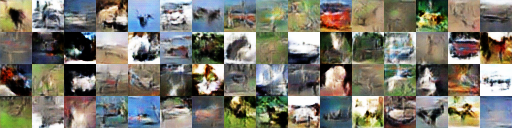

[24/100][1425/1875][8500] Loss_D: 3.339609 Loss_G: -0.082841 Loss_D_real: 5.324421 Loss_D_fake 1.984812 710.4293677806854


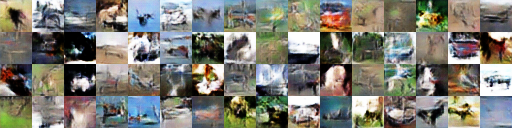

[26/100][270/1875][9000] Loss_D: 2.003567 Loss_G: 0.352485 Loss_D_real: 2.201386 Loss_D_fake 0.197819 750.0551745891571


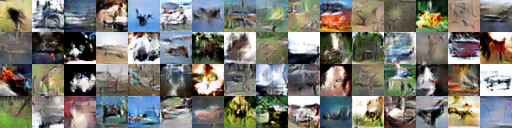

[27/100][990/1875][9500] Loss_D: 2.560457 Loss_G: 1.176164 Loss_D_real: 3.724673 Loss_D_fake 1.164216 789.4545366764069


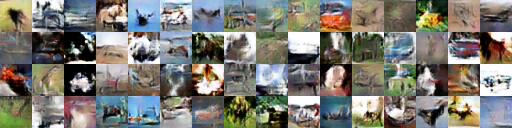

[28/100][1710/1875][10000] Loss_D: 2.849030 Loss_G: -2.263795 Loss_D_real: -1.208242 Loss_D_fake -4.057272 828.9155142307281


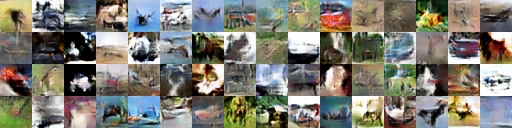

[30/100][555/1875][10500] Loss_D: 1.178301 Loss_G: 2.336631 Loss_D_real: 3.947376 Loss_D_fake 2.769075 868.6771056652069


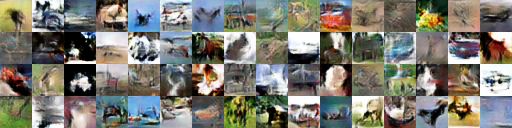

[31/100][1275/1875][11000] Loss_D: 2.176089 Loss_G: 0.335405 Loss_D_real: 5.270123 Loss_D_fake 3.094033 908.2958791255951


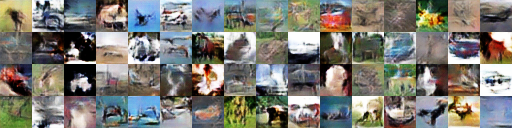

[33/100][120/1875][11500] Loss_D: 2.348024 Loss_G: -1.541014 Loss_D_real: 4.920057 Loss_D_fake 2.572033 948.1461441516876


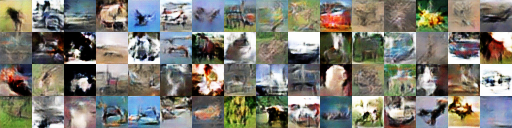

[34/100][840/1875][12000] Loss_D: 1.703492 Loss_G: 0.627045 Loss_D_real: 2.342199 Loss_D_fake 0.638707 987.7492294311523


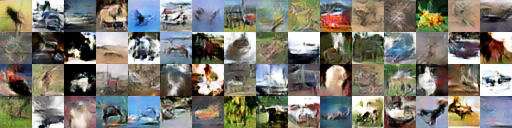

[35/100][1560/1875][12500] Loss_D: 2.104594 Loss_G: -0.764859 Loss_D_real: 3.155006 Loss_D_fake 1.050412 1027.5691578388214


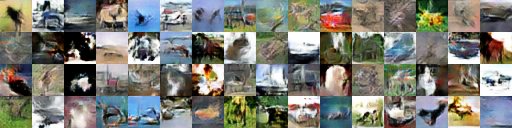

[37/100][405/1875][13000] Loss_D: 2.188225 Loss_G: 0.726332 Loss_D_real: 2.390710 Loss_D_fake 0.202485 1067.3497734069824


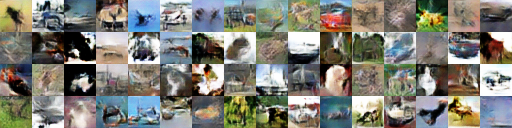

[38/100][1125/1875][13500] Loss_D: 2.243754 Loss_G: 0.642787 Loss_D_real: -1.363629 Loss_D_fake -3.607383 1107.0530557632446


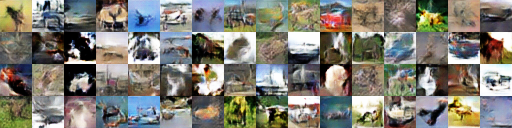

[39/100][1845/1875][14000] Loss_D: 2.176785 Loss_G: 2.453975 Loss_D_real: 2.302509 Loss_D_fake 0.125724 1146.3242392539978


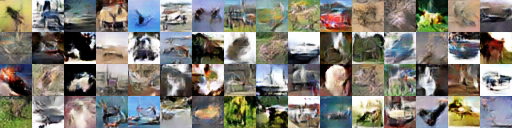

[41/100][690/1875][14500] Loss_D: 2.046093 Loss_G: -0.138448 Loss_D_real: -0.895038 Loss_D_fake -2.941131 1186.2101466655731


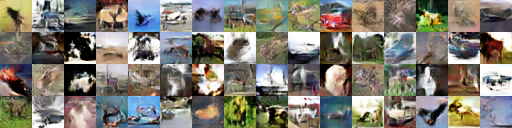

[42/100][1410/1875][15000] Loss_D: 2.407982 Loss_G: -0.081501 Loss_D_real: 4.579140 Loss_D_fake 2.171157 1225.649561882019


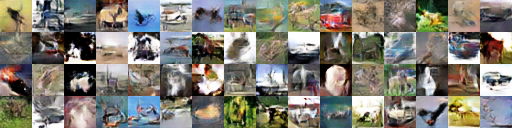

[44/100][255/1875][15500] Loss_D: 1.939060 Loss_G: 0.730713 Loss_D_real: 0.731059 Loss_D_fake -1.208001 1265.9244377613068


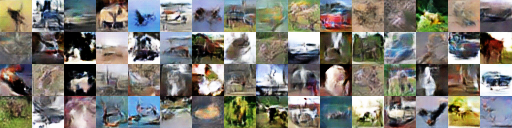

[45/100][975/1875][16000] Loss_D: 2.006848 Loss_G: 2.106903 Loss_D_real: 1.175765 Loss_D_fake -0.831083 1305.0239803791046


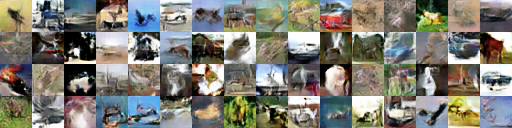

[46/100][1695/1875][16500] Loss_D: 2.238271 Loss_G: 2.313237 Loss_D_real: -0.580464 Loss_D_fake -2.818736 1344.5032827854156


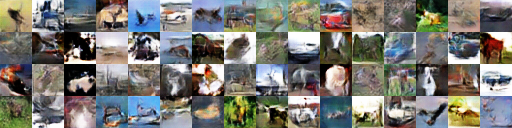

[48/100][540/1875][17000] Loss_D: 1.567619 Loss_G: -0.376569 Loss_D_real: -0.903459 Loss_D_fake -2.471078 1384.2606465816498


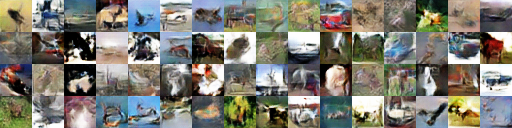

[49/100][1260/1875][17500] Loss_D: 1.967872 Loss_G: -3.594815 Loss_D_real: -1.360989 Loss_D_fake -3.328862 1423.8983871936798


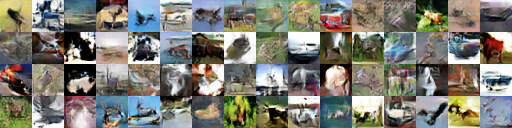

[51/100][105/1875][18000] Loss_D: 1.887126 Loss_G: -1.275050 Loss_D_real: 0.850406 Loss_D_fake -1.036720 1463.8991038799286


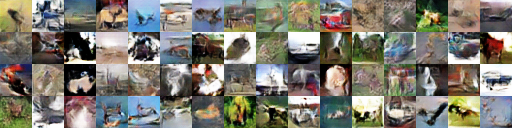

[52/100][825/1875][18500] Loss_D: 1.554186 Loss_G: 0.770531 Loss_D_real: 2.684825 Loss_D_fake 1.130639 1503.6675870418549


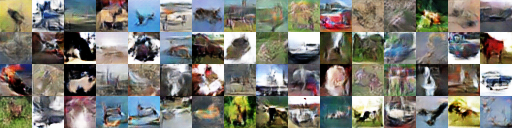

[53/100][1545/1875][19000] Loss_D: 1.831522 Loss_G: 1.514778 Loss_D_real: 2.190591 Loss_D_fake 0.359068 1543.5910329818726


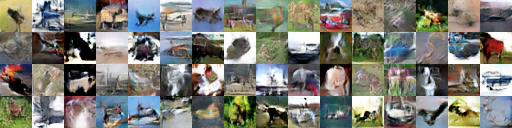

[55/100][390/1875][19500] Loss_D: 2.216034 Loss_G: 0.413546 Loss_D_real: 2.600783 Loss_D_fake 0.384748 1584.045402765274


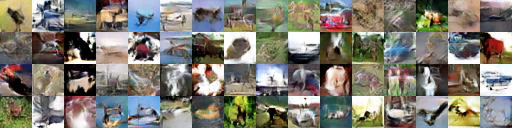

[56/100][1110/1875][20000] Loss_D: 2.043376 Loss_G: -0.881500 Loss_D_real: 0.230950 Loss_D_fake -1.812427 1623.967092514038


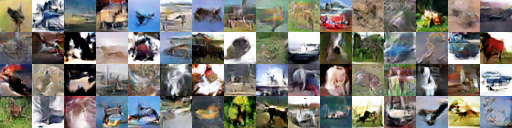

[57/100][1830/1875][20500] Loss_D: 1.855107 Loss_G: 1.797555 Loss_D_real: 0.255329 Loss_D_fake -1.599778 1663.949149131775


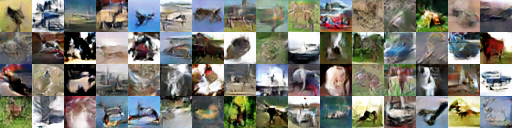

[59/100][675/1875][21000] Loss_D: 1.593201 Loss_G: -0.254837 Loss_D_real: -1.279194 Loss_D_fake -2.872395 1703.9495458602905


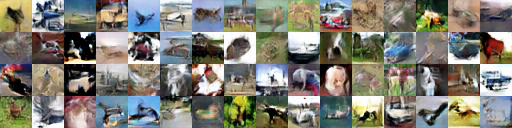

[60/100][1395/1875][21500] Loss_D: 1.874635 Loss_G: 1.428796 Loss_D_real: 2.739300 Loss_D_fake 0.864665 1744.0625531673431


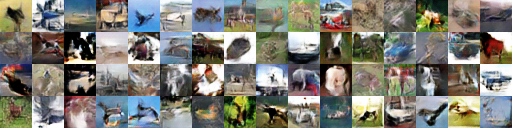

[62/100][240/1875][22000] Loss_D: 3.173004 Loss_G: -1.394681 Loss_D_real: 2.044553 Loss_D_fake -1.128451 1784.4168598651886


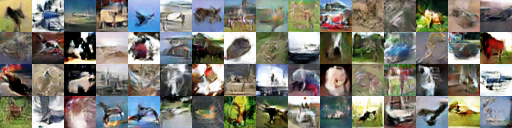

[63/100][960/1875][22500] Loss_D: 2.154272 Loss_G: -0.917165 Loss_D_real: 4.893340 Loss_D_fake 2.739069 1824.3678617477417


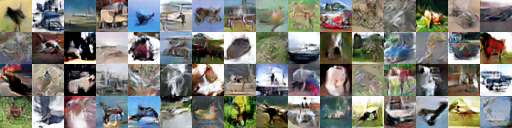

[64/100][1680/1875][23000] Loss_D: 2.474472 Loss_G: 2.408941 Loss_D_real: -3.095599 Loss_D_fake -5.570070 1864.3381357192993


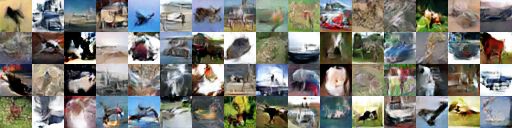

[66/100][525/1875][23500] Loss_D: 1.842988 Loss_G: 0.960737 Loss_D_real: -0.480373 Loss_D_fake -2.323361 1904.3940753936768


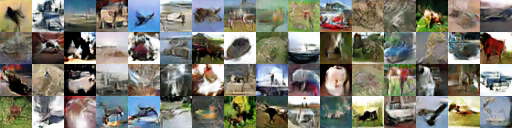

[67/100][1245/1875][24000] Loss_D: 1.487354 Loss_G: -1.081456 Loss_D_real: -0.750208 Loss_D_fake -2.237562 1944.1668953895569


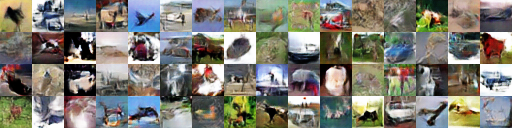

[68/100][1875/1875][24500] Loss_D: 1.236100 Loss_G: 1.092522 Loss_D_real: 0.369387 Loss_D_fake -0.866713 1983.8467531204224


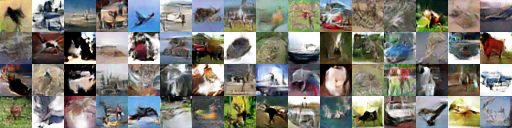

[70/100][720/1875][25000] Loss_D: 1.684509 Loss_G: -0.828888 Loss_D_real: 3.781862 Loss_D_fake 2.097354 2024.2163109779358


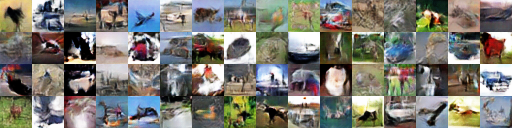

[71/100][1440/1875][25500] Loss_D: 1.888267 Loss_G: -2.379404 Loss_D_real: 3.570524 Loss_D_fake 1.682257 2063.9298577308655


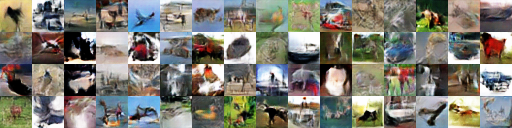

[73/100][285/1875][26000] Loss_D: 1.605382 Loss_G: 3.060010 Loss_D_real: 2.973851 Loss_D_fake 1.368469 2104.2500853538513


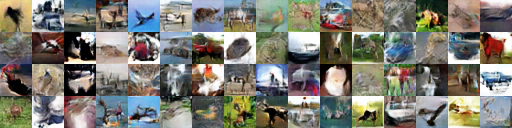

[74/100][1005/1875][26500] Loss_D: 1.564013 Loss_G: 0.863764 Loss_D_real: -0.913718 Loss_D_fake -2.477731 2144.8081617355347


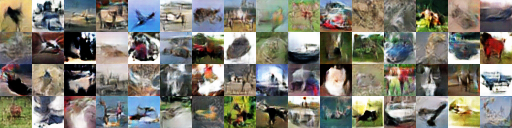

[75/100][1725/1875][27000] Loss_D: 1.096301 Loss_G: 0.806328 Loss_D_real: 1.595875 Loss_D_fake 0.499574 2185.3015100955963


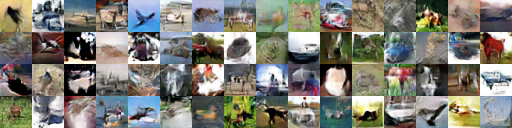

[77/100][570/1875][27500] Loss_D: 1.903837 Loss_G: -1.411058 Loss_D_real: -0.040560 Loss_D_fake -1.944397 2226.59055185318


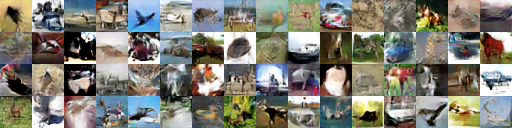

[78/100][1290/1875][28000] Loss_D: 2.022666 Loss_G: -1.308494 Loss_D_real: 3.057848 Loss_D_fake 1.035183 2267.3929674625397


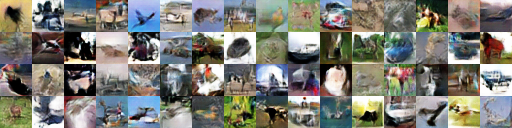

[80/100][135/1875][28500] Loss_D: 2.217243 Loss_G: 0.780418 Loss_D_real: 5.318385 Loss_D_fake 3.101142 2307.8588511943817


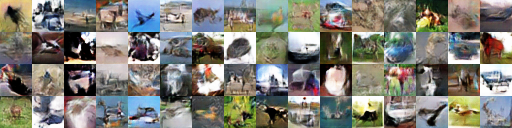

[81/100][855/1875][29000] Loss_D: 1.621050 Loss_G: 1.942152 Loss_D_real: 4.282224 Loss_D_fake 2.661174 2347.7219746112823


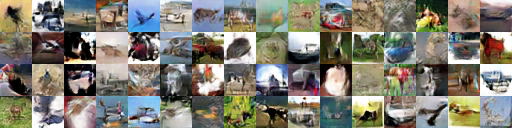

[82/100][1575/1875][29500] Loss_D: 2.256088 Loss_G: -0.679829 Loss_D_real: 3.279271 Loss_D_fake 1.023183 2387.3492317199707


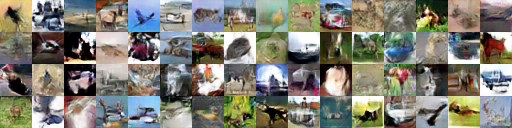

[84/100][420/1875][30000] Loss_D: 1.860872 Loss_G: -1.326943 Loss_D_real: 2.786358 Loss_D_fake 0.925486 2428.0258450508118


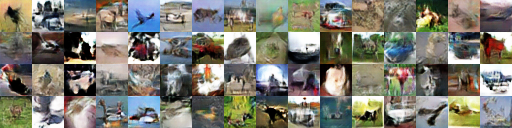

[85/100][1140/1875][30500] Loss_D: 2.323779 Loss_G: 1.912866 Loss_D_real: 2.046383 Loss_D_fake -0.277396 2467.827452659607


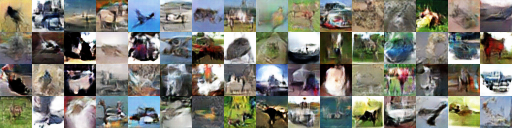

[86/100][1860/1875][31000] Loss_D: 2.751227 Loss_G: -1.729144 Loss_D_real: 3.218398 Loss_D_fake 0.467172 2507.865927696228


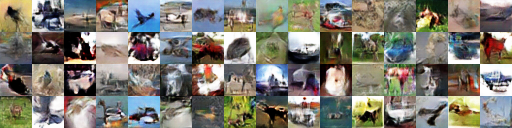

[88/100][705/1875][31500] Loss_D: 1.720660 Loss_G: -1.507877 Loss_D_real: 3.267566 Loss_D_fake 1.546906 2548.2874903678894


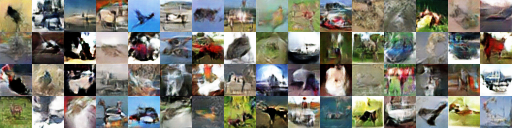

[89/100][1425/1875][32000] Loss_D: 2.368032 Loss_G: -0.397414 Loss_D_real: 0.888373 Loss_D_fake -1.479659 2587.818624019623


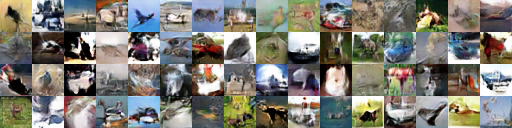

[91/100][270/1875][32500] Loss_D: 1.591828 Loss_G: 0.669496 Loss_D_real: 2.711489 Loss_D_fake 1.119661 2628.311976671219


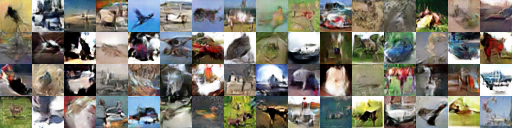

[92/100][990/1875][33000] Loss_D: 1.828803 Loss_G: -1.687015 Loss_D_real: 1.670789 Loss_D_fake -0.158014 2667.6564116477966


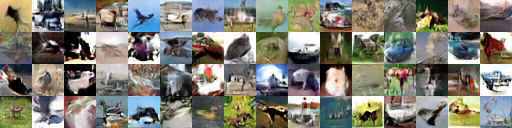

[93/100][1710/1875][33500] Loss_D: 1.530600 Loss_G: 2.819765 Loss_D_real: -0.256881 Loss_D_fake -1.787481 2707.114134788513


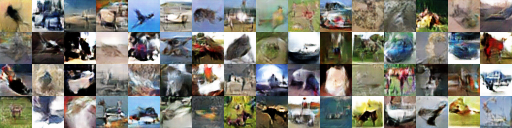

[95/100][555/1875][34000] Loss_D: 2.285388 Loss_G: 0.030100 Loss_D_real: 0.062470 Loss_D_fake -2.222918 2747.05188536644


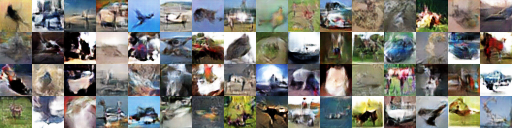

[96/100][1275/1875][34500] Loss_D: 1.522887 Loss_G: 2.062215 Loss_D_real: 3.222512 Loss_D_fake 1.699626 2786.748574256897


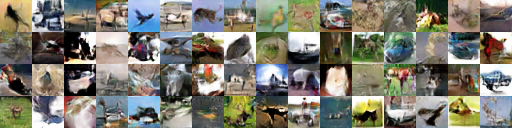

[98/100][120/1875][35000] Loss_D: 0.765028 Loss_G: 1.152498 Loss_D_real: 2.384025 Loss_D_fake 1.618997 2826.598084926605


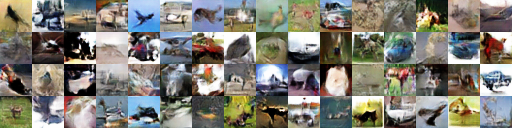

[99/100][840/1875][35500] Loss_D: 1.539572 Loss_G: 0.680126 Loss_D_real: 0.716457 Loss_D_fake -0.823115 2865.8156888484955


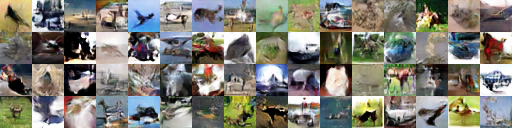

In [15]:
import time
t0 = time.time()
niter = 100
gen_iterations = 0
errG = 0
targetD = np.float32([2]*batchSize+[-2]*batchSize)[:, None]
targetG = np.ones(batchSize, dtype=np.float32)[:, None]
for epoch in range(niter):
    i = 0
    np.random.shuffle(train_X)
    batches = train_X.shape[0]//batchSize
    while i < batches:
        if gen_iterations < 25 or gen_iterations % 500 == 0:
            _Diters = 100
        else:
            _Diters = Diters
        j = 0
        while j < _Diters and i < batches:
            j+=1
            real_data = train_X[i*batchSize:(i+1)*batchSize]
            i+=1
            noise = np.random.normal(size=(batchSize, nz))        
            ϵ = np.random.uniform(size=(batchSize, 1, 1 ,1))        
            errD_real, errD_fake  = netD_train([real_data, noise, ϵ])
            errD = errD_real - errD_fake
       
        if gen_iterations%500==0:
            print('[%d/%d][%d/%d][%d] Loss_D: %f Loss_G: %f Loss_D_real: %f Loss_D_fake %f'
            % (epoch, niter, i, batches, gen_iterations,errD, errG, errD_real, errD_fake), time.time()-t0)
            fake = netG.predict(fixed_noise)
            showX(fake, 4)
        
        noise = np.random.normal(size=(batchSize, nz))        
        errG, = netG_train([noise])
        gen_iterations+=1 
        

## Çeşitli zorluklar ve Dikkat edilecek noktalar

GAN'lar çalıştırılması zor yapılardır, doğru hiperparametre ayarlaması, ağ yapısı, çalıştırılma protokolü gerektirler. Eğer hiperparametreler doğru ayarlanamazsa, ayırt edici ağ üretici ağı yener veya tam tersi olarak üretici ağ kazanır. Bu durumlarda doğru üretim gerçekleşmez.


Eğer ayırt edici ağ çok güçlü ayırt ederse, tüm üretilen resimleri her zaman uyduruk olarak sınıflar, bu durumda üretici ağ için türev hesaplanamaz ve dolayısı ile hiç üretim yapılamaz.


Bir diğer sorun da **modelin çökmesidir**. Üretici ağ ayırt edici ağ içinde bir zayıflık keşveder ve gürültüyü umursamadan hep aynı tip resimler oluşturur. Bu öğrenme katsayılarının iyi ayarlanması ile çözülebilir.


Gan'lar ile ilgili daha fazla ipucu için: ["GAN hacks"](https://github.com/soumith/ganhacks) sayfasını ziyaret edebilirsiniz.

## Diğer Kaynaklar

- [Orijinal GAN makalesi](https://arxiv.org/abs/1406.2661) by Ian Goodfellow et al 2014
- [En kapsamlı GAN makalesi ](https://arxiv.org/abs/1701.00160) Goodfellow
- [Alec Radford, Luke Metz, ve Soumith Chintala DCGAN makaleleri ](https://arxiv.org/abs/1511.06434) DCGAN'ın ilk tanıtım makalesi ve kodu [their DCGAN code on GitHub](https://github.com/Newmu/dcgan_code).
- [ Agustinus Kristiadi'den GAN refernasları](https://github.com/wiseodd/generative-models), tensorflow